# HeLa 2018 Dataset

This dataset was retrieved from [Searle, B. et. al. (2018) paper on chromatogram libraries](https://www.nature.com/articles/s41467-018-07454-w#Abs1). See the [data availability section](https://www.nature.com/articles/s41467-018-07454-w#data-availability). This dataset contains DDA data, DIA (wide window) and DIA (narrow) window data.

The data was converted from .raw to .mzML using msconvert, and then converted to sqMass using FileConverter (OpenMS).

- DIA Wide Window
  - 400 - 1000 m/z
- DIA Narrow Window
  - 400 - 500 m/z
  - 500 - 600 m/z
  - 600 - 700 m/z
  - 700 - 800 m/z
  - 800 - 900 m/z
  - 900 - 1000 m/z

In [1]:
# !pip install pyopenms-viz
import os
import numpy as np
import pandas as pd
import sqlite3
import polars as pl
import pyarrow
import zlib
import struct

import pyopenms_viz
import matplotlib.pyplot as plt
from bokeh.io import output_notebook
output_notebook();

# set global plotting backend for pandas
pd.options.plotting.backend = "ms_plotly" # one of: "ms_bokeh" "ms_matplotlib" "ms_plotly"

from plotly.subplots import make_subplots

from dquartic.utils.raw_data_parser import SqMassRawLoader

Loading BokehJS ...

In [2]:
iso_scheme = pd.read_csv("../data/human_chromatogram_library_demonstration-1729964479219/Q-Exactive_HF/isolation_window_scheme.csv", sep=",")

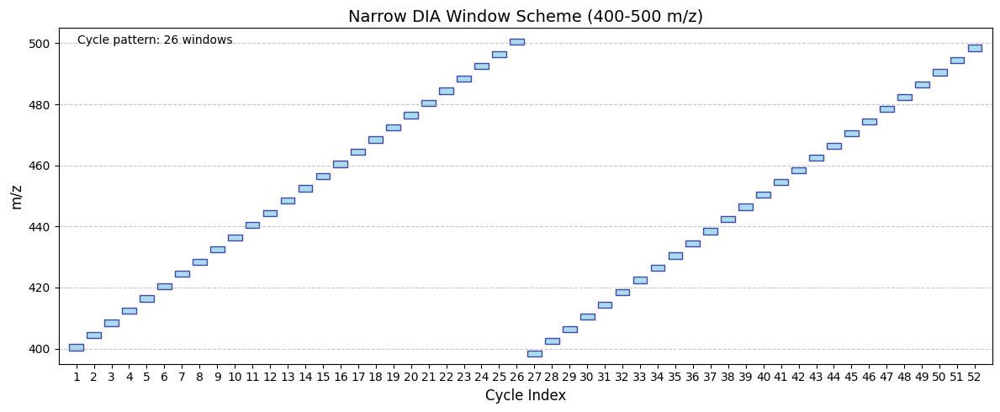

In [3]:

fig, ax = plt.subplots(figsize=(12, 5))

# Plot the isolation windows as vertical bars
for _, row in iso_scheme.iterrows():
    ax.bar(row['Cycle Index'], 2, bottom=row['Narrow Window (400-500 m/z)'] - 1, 
           width=0.8, align='center', alpha=0.7, color='skyblue', edgecolor='navy')

# Set labels and title
ax.set_xlabel('Cycle Index', fontsize=12)
ax.set_ylabel('m/z', fontsize=12)
ax.set_title('Narrow DIA Window Scheme (400-500 m/z)', fontsize=14)

# Set y-axis limits to focus on the 400-500 m/z range
ax.set_ylim(395, 505)

# Set x-axis limits and labels
ax.set_xlim(iso_scheme['Cycle Index'].min() - 1, iso_scheme['Cycle Index'].max() + 1)
ax.set_xticks(iso_scheme['Cycle Index'])
ax.set_xticklabels(iso_scheme['Cycle Index'])

# Add grid
ax.grid(True, axis='y', linestyle='--', alpha=0.7)

# Annotate the cycle pattern
ax.text(0.02, 0.98, 'Cycle pattern: 26 windows', transform=ax.transAxes, 
        verticalalignment='top', fontsize=10)

# Adjust layout and display
plt.tight_layout()
plt.show()


In [4]:
# os.listdir('../data/human_chromatogram_library_demonstration-1729964479219/Q-Exactive_HF/dia_narrow/')

In [5]:
input_file = "../data/human_chromatogram_library_demonstration-1729964479219/Q-Exactive_HF/dia_narrow/23aug2017_hela_serum_timecourse_4mz_narrow_1.sqMass"

loader = SqMassRawLoader(input_file)
loader.load_all_data()

In [6]:
loader.iso_win_info

ISOLATION_TARGET,ISOLATION_LOWER,ISOLATION_UPPER,mzStart,mzEnd
f64,f64,f64,f64,f64
397.431442,1.000443,1.000443,396.431,398.431885
399.431892,1.000008,1.000008,398.431885,400.4319
401.432343,1.000443,1.000443,400.4319,402.432785
403.433243,1.000458,1.000458,402.432785,404.433701
405.434143,1.000443,1.000443,404.433701,406.434586
…,…,…,…,…
493.474175,1.000465,1.000465,492.473709,494.47464
495.475098,1.000458,1.000458,494.47464,496.475555
497.476021,1.000465,1.000465,496.475555,498.476486


In [15]:
loader.ms1_data.to_pandas().plot(kind="peakmap", x="RETENTION_TIME", y="mz", z="intensity", add_marginals=True, width=800, height=600)

In [16]:
loader.ms2_data.to_pandas().plot(kind="peakmap", x="RETENTION_TIME", y="mz", z="intensity", add_marginals=True, width=800, height=600)

/home/singjc/Documents/github/pyopenms_viz/pyopenms_viz/_core.py:255: UserWarning:

Duplicate data detected, data will not be aggregated which may lead to unexpected plots. To enable aggregation set `aggregate_duplicates=True`.



In [54]:
rt_tgt = 1342.223
rt_win = 30
mz_iso_win_idx = 25

ms1_ms2_slice = loader.extract_ms_slice(rt_tgt, rt_win, mz_iso_win_idx)
ms1_ms2_slice.head()

Info: There are 3120 MS2 spectra in the 447.45324707 isolation window


SPECTRUM_ID,NATIVE_ID,RETENTION_TIME,mz,intensity,mslevel,normalized_intensity
i64,str,f64,f64,f64,i32,f64
27864,"""controllerType=0 controllerNum…",1327.50708,446.527069,42069.3125,1,0.000144
27864,"""controllerType=0 controllerNum…",1327.50708,446.700592,233067.296875,1,0.001218
27864,"""controllerType=0 controllerNum…",1327.50708,446.71701,226402.796875,1,0.001181
27864,"""controllerType=0 controllerNum…",1327.50708,446.739807,42616.132812,1,0.000147
27864,"""controllerType=0 controllerNum…",1327.50708,446.755829,275127.8125,1,0.001455


In [8]:
print(ms1_ms2_slice.filter(
    pl.col("mslevel")==1
).pivot(on="RETENTION_TIME", index="mz", values="intensity").shape)

print(ms1_ms2_slice.filter(
    pl.col("mslevel")==2
).pivot(on="RETENTION_TIME", index="mz", values="intensity").shape)

(620, 27)
(7008, 13)


In [55]:
print("MS1")
print(
ms1_ms2_slice.filter(
    pl.col("mslevel")==1
).select('RETENTION_TIME', 'mz', 'intensity').describe()
)

print("MS2")
print(
ms1_ms2_slice.filter(
    pl.col("mslevel")==2
).select('RETENTION_TIME', 'mz', 'intensity').describe()
)

MS1
shape: (9, 4)
┌────────────┬────────────────┬────────────┬───────────────┐
│ statistic  ┆ RETENTION_TIME ┆ mz         ┆ intensity     │
│ ---        ┆ ---            ┆ ---        ┆ ---           │
│ str        ┆ f64            ┆ f64        ┆ f64           │
╞════════════╪════════════════╪════════════╪═══════════════╡
│ count      ┆ 655.0          ┆ 655.0      ┆ 655.0         │
│ null_count ┆ 0.0            ┆ 0.0        ┆ 0.0           │
│ mean       ┆ 1341.88393     ┆ 447.39198  ┆ 2.9178e6      │
│ std        ┆ 8.807507       ┆ 0.547919   ┆ 1.4695e7      │
│ min        ┆ 1327.50708     ┆ 446.453094 ┆ 16481.039062  │
│ 25%        ┆ 1334.80386     ┆ 446.904846 ┆ 77345.273438  │
│ 50%        ┆ 1342.05408     ┆ 447.299805 ┆ 193271.671875 │
│ 75%        ┆ 1349.41242     ┆ 447.761169 ┆ 430019.03125  │
│ max        ┆ 1356.6066      ┆ 448.402985 ┆ 1.77797216e8  │
└────────────┴────────────────┴────────────┴───────────────┘
MS2
shape: (9, 4)
┌────────────┬────────────────┬────────────┬─────

In [9]:
fig  = loader.plot_xic_peakmap(ms1_ms2_slice, rt_tgt, rt_win, mz_iso_win_idx)

/home/singjc/Documents/github/pyopenms_viz/pyopenms_viz/_core.py:255: UserWarning:

Duplicate data detected, data will not be aggregated which may lead to unexpected plots. To enable aggregation set `aggregate_duplicates=True`.



In [10]:
fig  = loader.plot_peakmap_3d(ms1_ms2_slice, rt_tgt, rt_win, mz_iso_win_idx)

fig.write_html("ms_3d_peakmap.html")

In [12]:
rt_tgt = 1342.223
rt_win = 30
mz_iso_win_idx = 26

ms1_ms2_slice = loader.extract_ms_slice(rt_tgt, rt_win, mz_iso_win_idx)
ms1_ms2_slice.head()

print(ms1_ms2_slice.filter(
    pl.col("mslevel")==1
).pivot(on="RETENTION_TIME", index="mz", values="intensity").shape)

print(ms1_ms2_slice.filter(
    pl.col("mslevel")==2
).pivot(on="RETENTION_TIME", index="mz", values="intensity").shape)

Info: There are 3120 MS2 spectra in the 449.45414734 isolation window
(398, 27)
(5572, 13)


In [13]:
fig  = loader.plot_peakmap_3d(ms1_ms2_slice, rt_tgt, rt_win, mz_iso_win_idx)

# Wide Window DIA

In [17]:
input_file = "../data/human_chromatogram_library_demonstration-1729964479219/Q-Exactive_HF/dia_wide/23aug2017_hela_serum_timecourse_pool_wide_001.sqMass"

loader_wide = SqMassRawLoader(input_file)
loader_wide.load_all_data()

In [18]:
loader_wide.iso_win_info

ISOLATION_TARGET,ISOLATION_LOWER,ISOLATION_UPPER,mzStart,mzEnd
f64,f64,f64,f64,f64
394.434647,6.002762,6.002762,388.431885,400.437408
406.437378,5.999969,5.999969,400.437408,412.437347
418.440102,6.002754,6.002754,412.437347,424.442856
430.445557,6.002701,6.002701,424.442856,436.448257
442.451004,6.002747,6.002747,436.448257,448.453751
…,…,…,…,…
958.685654,6.002701,6.002701,952.682953,964.688354
970.691101,6.002747,6.002747,964.688354,976.693848
982.696564,6.002716,6.002716,976.693848,988.69928


In [19]:
loader_wide.ms1_data.to_pandas().plot(kind="peakmap", x="RETENTION_TIME", y="mz", z="intensity", add_marginals=True, width=800, height=600)

In [20]:
loader_wide.ms2_data.to_pandas().plot(kind="peakmap", x="RETENTION_TIME", y="mz", z="intensity", add_marginals=True, width=800, height=600)

/home/singjc/Documents/github/pyopenms_viz/pyopenms_viz/_core.py:255: UserWarning:

Duplicate data detected, data will not be aggregated which may lead to unexpected plots. To enable aggregation set `aggregate_duplicates=True`.



In [44]:
loader_wide.iso_win_info.with_row_index()\
    .filter(
    (pl.col("ISOLATION_TARGET") > 430 - 1) & (pl.col("ISOLATION_TARGET") < 500 + 1)
)

index,ISOLATION_TARGET,ISOLATION_LOWER,ISOLATION_UPPER,mzStart,mzEnd
u32,f64,f64,f64,f64,f64
3,430.445557,6.002701,6.002701,424.442856,436.448257
4,442.451004,6.002747,6.002747,436.448257,448.453751
5,454.456451,6.002701,6.002701,448.453751,460.459152
6,466.461899,6.002747,6.002747,460.459152,472.464645
7,478.467369,6.002724,6.002724,472.464645,484.470093
8,490.472816,6.002724,6.002724,484.470093,496.47554


In [56]:
rt_tgt = 1342.223
rt_win = 30
mz_iso_win_idx = 4

ms1_ms2_slice = loader_wide.extract_ms_slice(rt_tgt, rt_win, mz_iso_win_idx)
ms1_ms2_slice.head()

Info: There are 3262 MS2 spectra in the 442.45100403 isolation window


SPECTRUM_ID,NATIVE_ID,RETENTION_TIME,mz,intensity,mslevel,normalized_intensity
i64,str,f64,f64,f64,i32,f64
27804,"""controllerType=0 controllerNum…",1327.52964,436.546082,305383.5625,1,0.002709
27804,"""controllerType=0 controllerNum…",1327.52964,436.698761,717127.4375,1,0.00728
27804,"""controllerType=0 controllerNum…",1327.52964,436.732635,1.9091e6,1,0.02051
27804,"""controllerType=0 controllerNum…",1327.52964,436.762726,244911.875,1,0.002038
27804,"""controllerType=0 controllerNum…",1327.52964,436.879425,155236.484375,1,0.001043


In [46]:
print(ms1_ms2_slice.filter(
    pl.col("mslevel")==1
).pivot(on="RETENTION_TIME", index="mz", values="intensity").shape)

print(ms1_ms2_slice.filter(
    pl.col("mslevel")==2
).pivot(on="RETENTION_TIME", index="mz", values="intensity").shape)

(2417, 34)
(8282, 13)


In [58]:
print("MS1")
print(
ms1_ms2_slice.filter(
    pl.col("mslevel")==1
).select('RETENTION_TIME', 'mz', 'intensity').describe()
)

print("MS2")
print(
ms1_ms2_slice.filter(
    pl.col("mslevel")==2
).select('RETENTION_TIME', 'mz', 'intensity').describe()
)

MS1
shape: (9, 4)
┌────────────┬────────────────┬────────────┬───────────────┐
│ statistic  ┆ RETENTION_TIME ┆ mz         ┆ intensity     │
│ ---        ┆ ---            ┆ ---        ┆ ---           │
│ str        ┆ f64            ┆ f64        ┆ f64           │
╞════════════╪════════════════╪════════════╪═══════════════╡
│ count      ┆ 2577.0         ┆ 2577.0     ┆ 2577.0        │
│ null_count ┆ 0.0            ┆ 0.0        ┆ 0.0           │
│ mean       ┆ 1342.16361     ┆ 442.760911 ┆ 2.5664e6      │
│ std        ┆ 8.697564       ┆ 3.488005   ┆ 7.2255e6      │
│ min        ┆ 1327.52964     ┆ 436.536713 ┆ 61278.796875  │
│ 25%        ┆ 1334.79624     ┆ 439.943817 ┆ 208052.609375 │
│ 50%        ┆ 1342.1484      ┆ 442.847473 ┆ 599283.875    │
│ 75%        ┆ 1349.42886     ┆ 445.868835 ┆ 1.7931e6      │
│ max        ┆ 1356.69222     ┆ 448.268127 ┆ 9.015572e7    │
└────────────┴────────────────┴────────────┴───────────────┘
MS2
shape: (9, 4)
┌────────────┬────────────────┬────────────┬─────

In [47]:
fig  = loader_wide.plot_xic_peakmap(ms1_ms2_slice, rt_tgt, rt_win, mz_iso_win_idx)

/home/singjc/Documents/github/pyopenms_viz/pyopenms_viz/_core.py:255: UserWarning:

Duplicate data detected, data will not be aggregated which may lead to unexpected plots. To enable aggregation set `aggregate_duplicates=True`.



In [59]:
fig  = loader_wide.plot_peakmap_3d(ms1_ms2_slice, rt_tgt, rt_win, mz_iso_win_idx)

fig.write_html("ms_3d_peakmap_dia_Wide.html")